In [1]:
import sys
import os

current_dir = os.path.dirname(os.path.abspath('__file__'))

project_root = os.path.abspath(os.path.join(current_dir, '..'))

if project_root not in sys.path:
    sys.path.insert(0, project_root)

from utils.utils import load_image, apply, display_image, display_image_comparison, rgb_to_grayscale

# Chapter 7: Spatial Frequency Filtering

## Spatial Frequency

**Spatial frequency** refers to the rate at which the intensity or color of an image changes with respect to space. The spatial frequency is a measure of how often sinusoidal components (as determined by the Fourier transform) of the image repeat per unit of distance.

Images can be decomposed into spatial frequencies that represent details at different scales:

- **Low spatial frequencies** capture large, smooth variations (e.g., overall lighting or large objects).
- **High spatial frequencies** represent rapid changes (e.g., edges, textures, fine details).

We can decompose an image $\mathbf{I}$ into it's spatial frequencies using a Fourier transform. The spatial frequency image $\mathbf{F}$ at position $[u,v]$ is computed as a Fourier transform:
$$
    \mathbf{F}[u,v] = \int^{\infty}_{-\infty} \int^{\infty}_{-\infty}  \mathbf{I}[x,y] \cdot e^{-j2\pi(ux/M + vy/N)} dy \, dx,
$$
wher $M$ and $N$ are the dimensions of the image $\mathbf{I}$.

The magnitude $\vert \mathbf{F}[u,v] \vert$ indicates the strength of a specific frequency, while the phase encodes spatial alignment.

### Visualization

We can visualize the spatial frequencies of an image using NumPy's built in `fft.fft2` function which is a 2-D fast Fourier transform.

We center and scale the resulting image for better visualization.

In [2]:
import numpy as np

In [3]:
def generate_frequency_spectrum(I: np.ndarray) -> np.ndarray:
    F = np.fft.fft2(I)
    F_shifted = np.fft.fftshift(F)
    F_shifted_magnitude_scaled = 20 * np.log(np.abs(F_shifted) + 1e-5)
    return F_shifted_magnitude_scaled

In [4]:
image_1_path = "../TEST-IMAGES/ADDITIONAL/fruits.ppm"
image_1 = load_image(image_1_path)

Image Metadata for 'fruits.ppm':
 - Format: PPM
 - Size on Disk: 720.01 KB
 - Dimensions: 512x480 pixels
 - Mode: RGB
 - Channels: 3


Since the image is in RGB, we'll first have to convert it to grayscale.

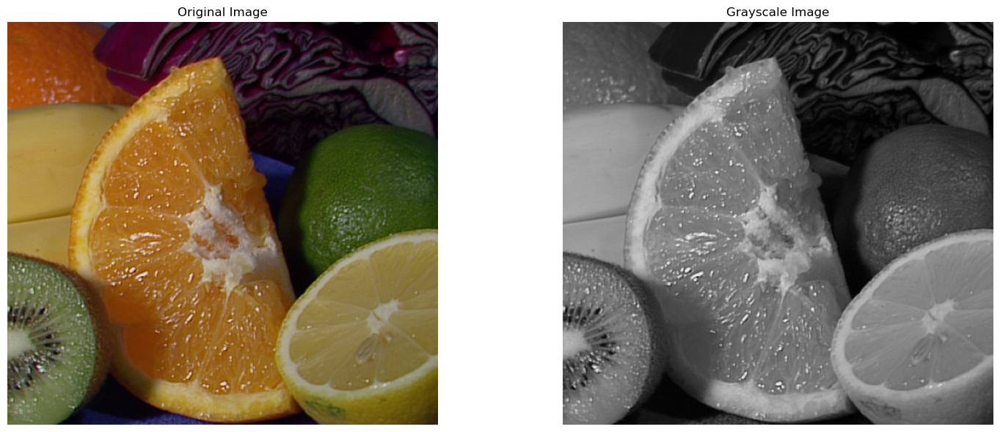

In [5]:
grayscale_image_1 = apply(image_1, rgb_to_grayscale)
display_image_comparison(image_1, grayscale_image_1, 'Original Image', 'Grayscale Image')

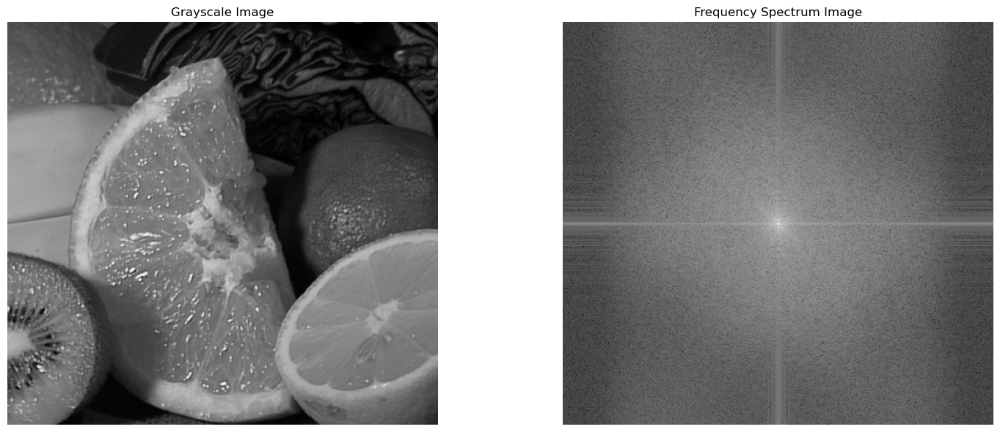

In [6]:
frequency_spectrum_image_1 = apply(grayscale_image_1, generate_frequency_spectrum)
display_image_comparison(grayscale_image_1, frequency_spectrum_image_1, 'Grayscale Image', 'Frequency Spectrum Image')

There are a few ways to interpert a frequency spectrum image, different characterists of the frequenct spectrum capture and accentuate different aspects of the original image.

We encounter low spatial frequencies at the center. In our example this corresponds is the bright spot in the middle. These frequencies capture large, smooth variations in the image, such as the overall intensity or illumination. Low frequencies usually correspond to broad areas or large *features* in the image.

As you move outward from the center, you encounter higher spatial frequencies. In our example this is the noisy areas around the center. High frequencies represent rapid changes in intensity, such as edges, fine details, and textures.

We can observe in our frequency spectrum some horizontal lines on the far right and left, these lines represent the vertical features in the original image. Since the vertical lines in the image are much less intense (*see top and bottom of frequency spectrum*) we can say that we have more vertical features than horizontal features in this image.

In a frequency spectrum like this one the intensity or brightness of an area represents its presence in the original image. The brighter an area is the more it contibutes to the spatial frequency. In our example the center is much brighter than the edges, idicating that low frequencies dominate. This is common in *natural* images with gradual variations.

We'll observe how the frequency spectrum image changes as we perfom operations like *filtering*.

## Spatial Frequency Filtering

**Filtering** modifies the spatial frequency content of an image by emphasizing or suppressing certain frequencies. The goal is to isolate specific details (like edges) or smooth out unwanted features (like noise). In essence, spatial frequency filtering can be understood as reshaping or scaling the Fourier spectrum of an image.

Filtering in the frequency domain involves modifying $\mathbf{F}$ directly to suppress or amplify specific frequency ranges:
- Low-pass filters preserve low frequencies (smooth regions) and remove high frequencies (edges and noise).
- High-pass filters remove low frequencies (smooth regions) and preserve high frequencies (edges and fine details).

In the *spatial domain* (the domain of the image as we see it), filtering is performed using convolution. For an image $\mathbf{I}$ and a kernel/filter $\mathbf{K}$ the filtered image $\mathbf{G}$ is computed as:
$$
    \mathbf{G} = \mathbf{I} * \mathbf{K}
$$

A convolution in the spatial domain corresponds to a multiplication in the frequency domain, this follows from the *convolution theorem* which states that: *Under suitable conditions the Fourier transform of a convolution of two functions (or signals) is the product of their Fourier transforms.*
$$
    \mathbf{G} \leftrightarrow \mathbf{H} \cdot \mathbf{F},
$$
where $\mathbf{H}$ is the Fourier transform of the filter, and $\mathbf{F}$ is the Fourier transform of the image.

The specifics of spatial frequency filtering are more complex than the scope of this course, but the point to remember here is that the operation we want to perform in the frequency domain is a product or scaling operation to adjust the importance of different frequencies, and that to acheive this scaling we have to perform a convolution in the spatial domain. This is good for us because it saves us the trouble from having to compute any Fourier transforms, and only work with discrete convolutions, which are much simpler.

### Implementation

Since applying filtering is simply a convolution operation we can just use the SciPy's `convolve2d`.

In [7]:
from scipy.signal import convolve2d

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Low-Pass Filtering

To perform low-pass filtering we use a Gaussian filter, which has large values in the center and small values at the edges. A low-pass filter smooths the image by averaging out rapid changes (high frequencies) which removes things like edges and noise. Low-pass filtering is akin to blurring an image.

The general formula for a Gaussian kernel is:
$$
    K[x, y] = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}},
$$
where $x$ and $y$ are spatial coordinates, and $\sigma$ controls the spread of the Gaussian.

For discrete filters, we normalize the values to ensure the sum of the kernel equals 1, which preserves the overall intensity of the image.

There are a few variants of Gaussian filters, some common ones include:

- $3 \times 3$
  $$
    \mathbf{K}_3 = \frac{1}{16}
    \begin{bmatrix}
    1 & 2 & 1 \\
    2 & 4 & 2 \\
    1 & 2 & 1
    \end{bmatrix}.
  $$
  
- $5 \times 5$
  $$
    \mathbf{K}_5 = \frac{1}{256}
    \begin{bmatrix}
    1 &  4 &  6 &  4 & 1 \\
    4 & 16 & 24 & 16 & 4 \\
    6 & 24 & 36 & 24 & 6 \\
    4 & 16 & 24 & 16 & 4 \\
    1 &  4 &  6 &  4 & 1
    \end{bmatrix}.
  $$

- $7 \times 7$
  $$
    \mathbf{K}_7 = \frac{1}{4096}
    \begin{bmatrix}
    1 &   6 &  15 &  20 &  15 &   6 &  1 \\
    6 &  36 &  90 & 120 &  90 &  36 &  6 \\
    15 & 90 & 225 & 300 & 225 &  90 & 15 \\
    20 &120 & 300 & 400 & 300 & 120 & 20 \\
    15 & 90 & 225 & 300 & 225 &  90 & 15 \\
    6 &  36 &  90 & 120 &  90 &  36 &  6 \\
    1 &   6 &  15 &  20 &  15 &   6 &  1
    \end{bmatrix}.
  $$

Instead of using these predifined filters, we can use the formula for a Gaussian kernel to generate filters of any size.

#### Implementation

We'll use the NumPy's `meshgrid` function to discretely evaluate the Gaussian function in our filter array.

In [8]:
import numpy as np

In [9]:
def generate_gaussian_kernel(size: int, sigma: float = 1.0) -> np.ndarray:
    if size % 2 == 0:
        raise ValueError("Kernel size must be an odd number.")

    k = size // 2
    x, y = np.meshgrid(np.arange(-k, k+1), np.arange(-k, k+1))

    K = np.exp(-(x**2 + y**2) / (2 * sigma**2))

    K /= np.sum(K)

    return K

### High-Pass Filtering

To perform high-pass filtering we usually use a Laplacian kernel, which has near zero values in the center and negative values further away. A high-pass filter enhances features like edges, fine details, and textures, making it useful for edge detection and sharpening of an image.

The general formula for a Laplacian kernel is:
$$
    \Delta I[x, y] = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}.
$$
 
Although it is possible to use this formula to generate laplacian kernels of arbitrary size, it isn't very practical to do so. Other ways to create *Laplacian-like* kernels like Laplacian of Gaussians (LoG) do exist, but are not covered by this course.

Some common varaints of the Laplacian include:

- $3 \times 3$
  $$
    \mathbf{K}_3 =
    \begin{bmatrix}
    0 & -1 &  0 \\
    -1 &  4 & -1 \\
    0 & -1 &  0
    \end{bmatrix}.
  $$

- $3 \times 3$ Edge Detection Variant 
  $$
    \mathbf{K}_3 =
    \begin{bmatrix}
    -1 & -1 & -1 \\
    -1 &  8 & -1 \\
    -1 & -1 & -1
    \end{bmatrix}.
  $$

- $5 \times 5$
  $$
    \mathbf{K}_5 =
    \begin{bmatrix}
    0 &  0 & -1 &  0 &  0 \\
    0 & -1 & -2 & -1 &  0 \\
    -1 & -2 & 16 & -2 & -1 \\
    0 & -1 & -2 & -1 &  0 \\
    0 &  0 & -1 &  0 &  0
    \end{bmatrix}.
  $$

#### Implementation

In [10]:
K_3_laplacian = np.array([
    [ 0, -1,  0],
    [-1,  4, -1],
    [ 0, -1,  0]
])

K_3_laplacian_edge = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
])

K_5_laplacian = np.array([
    [ 0,  0, -1,  0,  0],
    [ 0, -1, -2, -1,  0],
    [-1, -2, 16, -2, -1],
    [ 0, -1, -2, -1,  0],
    [ 0,  0, -1,  0,  0]
])

### Median Filtering

**Median filtering** is a special type of low-pass filter used primarily to remove noise from an image while preserving edges. Unlike linear filters such as Gaussian or Laplacian filters, the median filter does not involve convolution but instead operates by replacing each pixel value with the median value of the pixel's neighborhood.

To apply a median filter to an image $\mathbf{I}$ we apply the following procedure:
1. For each pixel $[x,y] \in \mathbf{I}$:
   1. Define a neighborhood (e.g., a $3 \times 3$, $5 \times 5$, or $7 \times 7$ square window) around the pixel.
   2. Sort the pixel values within the neighborhood in ascending order.
   3. Replace the original pixel value with the median value from the sorted list.

#### Implementation

SciPy as provides an implementation of median filtering using `median_filter`.

In [11]:
from scipy.ndimage import median_filter

### Examples

#### Example 1

In [12]:
image_2_path = "../TEST-IMAGES/ADDITIONAL/cablecar.ppm"
image_2 = load_image(image_2_path)

Image Metadata for 'cablecar.ppm':
 - Format: PPM
 - Size on Disk: 720.04 KB
 - Dimensions: 512x480 pixels
 - Mode: RGB
 - Channels: 3


Since the image is in RGB, we'll first have to convert it to grayscale.

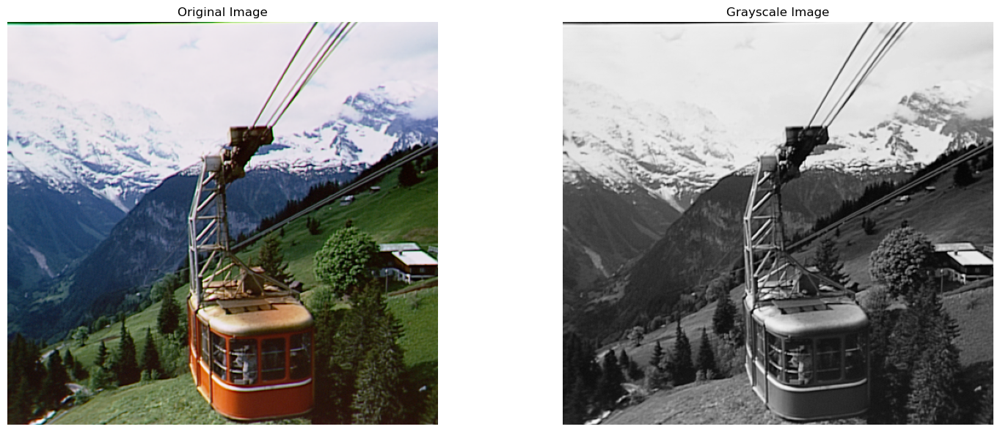

In [13]:
grayscale_image_2 = apply(image_2, rgb_to_grayscale)
display_image_comparison(image_2, grayscale_image_2, 'Original Image', 'Grayscale Image')

Lets compare how each type of filtering (low, high, median) affects the image.

We'll use the $3 \times 3$ variants from each filter.

In [14]:
K_3_gaussian = generate_gaussian_kernel(3)

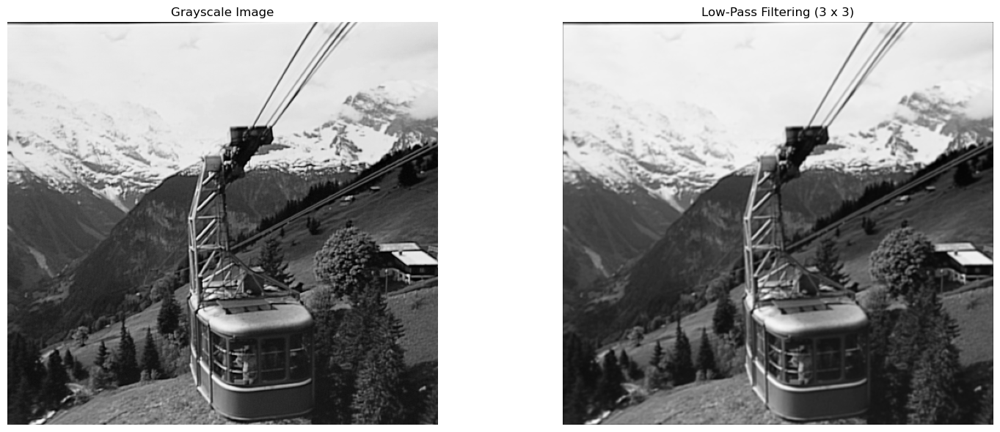

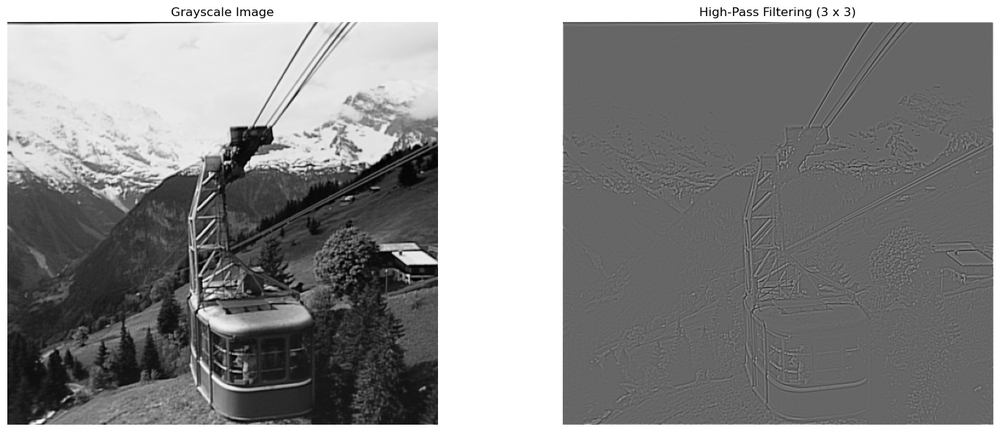

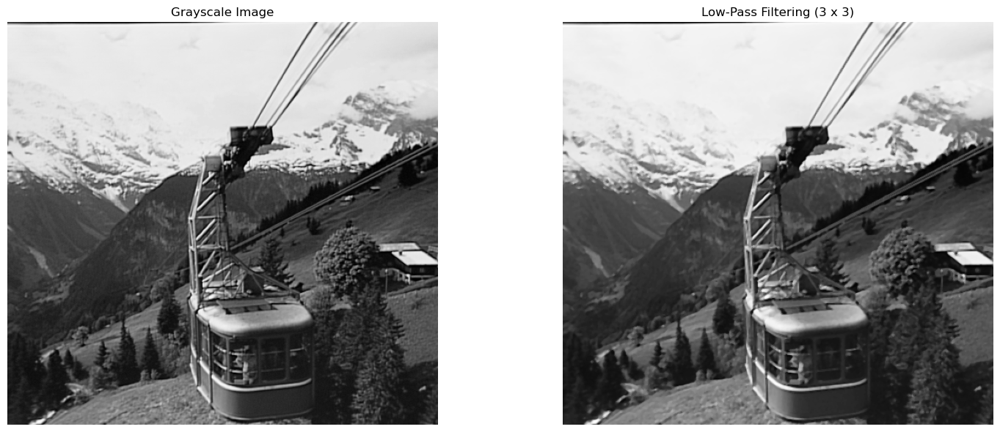

In [15]:
operations = [
    {'name': 'Low-Pass Filtering (3 x 3)', 'func': convolve2d, 'params': {'in2': K_3_gaussian, 'mode': 'same'}},
    {'name': 'High-Pass Filtering (3 x 3)', 'func': convolve2d, 'params': {'in2': K_3_laplacian, 'mode': 'same'}},
    {'name': 'Low-Pass Filtering (3 x 3)', 'func': median_filter, 'params': {'size': 3}},
]

for op in operations:
    filtered_image = apply(grayscale_image_2, op['func'], **op['params'])
    display_image_comparison(grayscale_image_2, filtered_image, 'Grayscale Image', op['name'])

We can see that high-pass filtering is the most drastic of the 3, producing a edge-detected image of the original image.

#### Example 2

In [16]:
image_3_path = "../TEST-IMAGES/CLASSIC/boats.bmp"
image_3 = load_image(image_3_path)

Image Metadata for 'boats.bmp':
 - Format: BMP
 - Size on Disk: 406.05 KB
 - Dimensions: 720x576 pixels
 - Mode: L
 - Channels: 1


For this example let's see how the value for sigma $\sigma$ in the Gaussian affects the output image.

We'll set a standard size for the kernel = 7.

In [17]:
K_7_sigma_0_5_gaussian = generate_gaussian_kernel(7, 0.5)
K_7_sigma_1_gaussian = generate_gaussian_kernel(7, 1.0)
K_7_sigma_2_gaussian = generate_gaussian_kernel(7, 2.0)
K_7_sigma_3_gaussian = generate_gaussian_kernel(7, 3.0)
K_7_sigma_4_gaussian = generate_gaussian_kernel(7, 4.0)

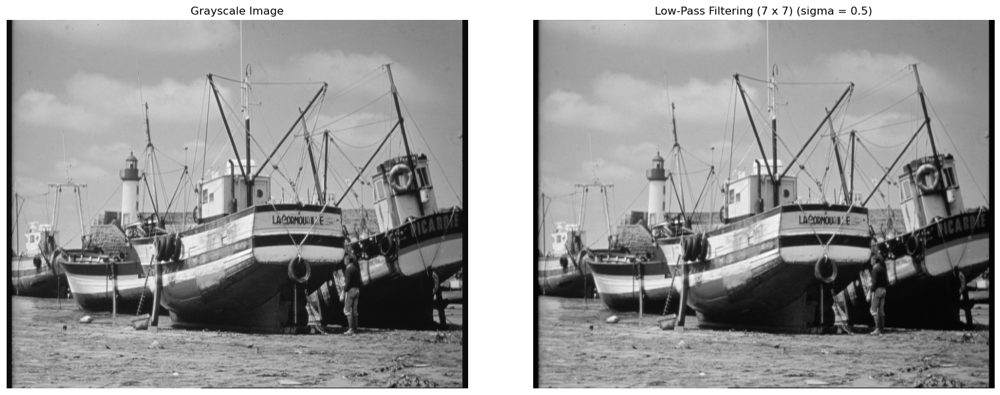

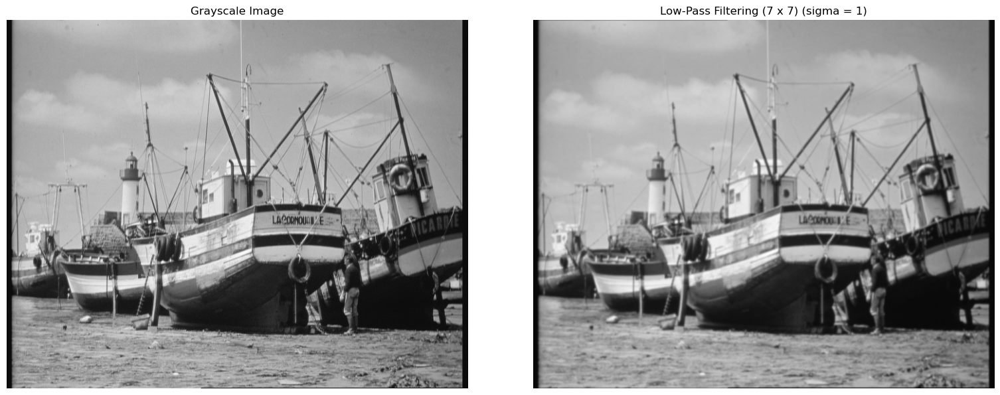

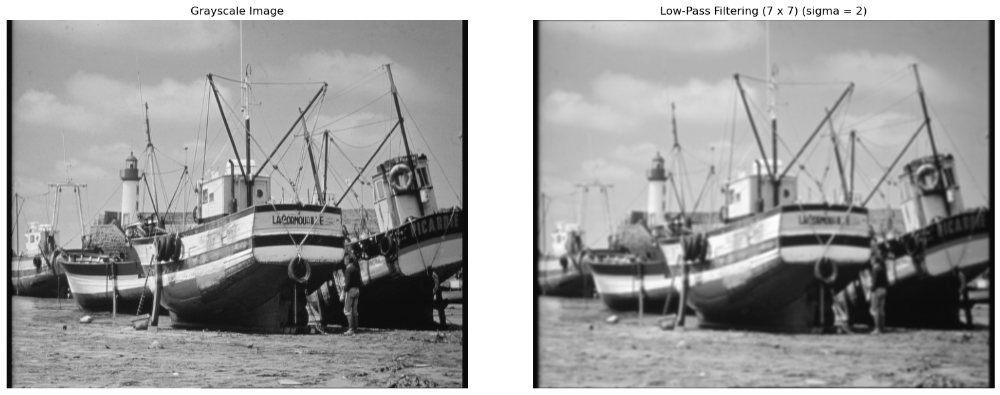

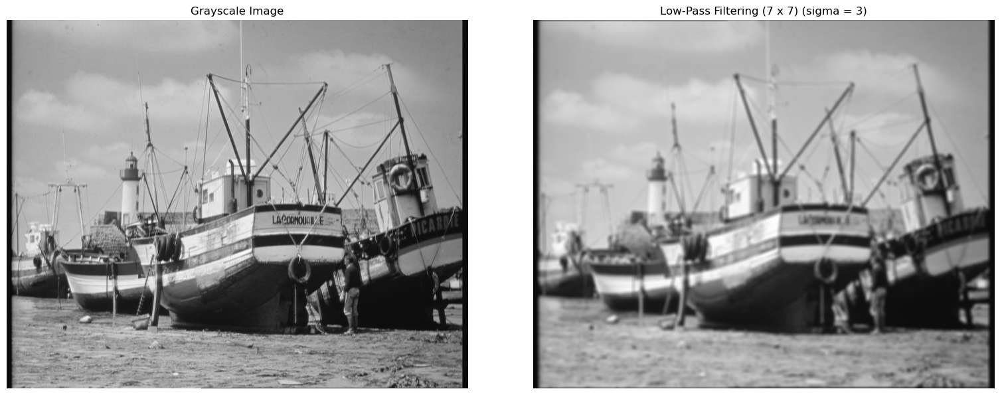

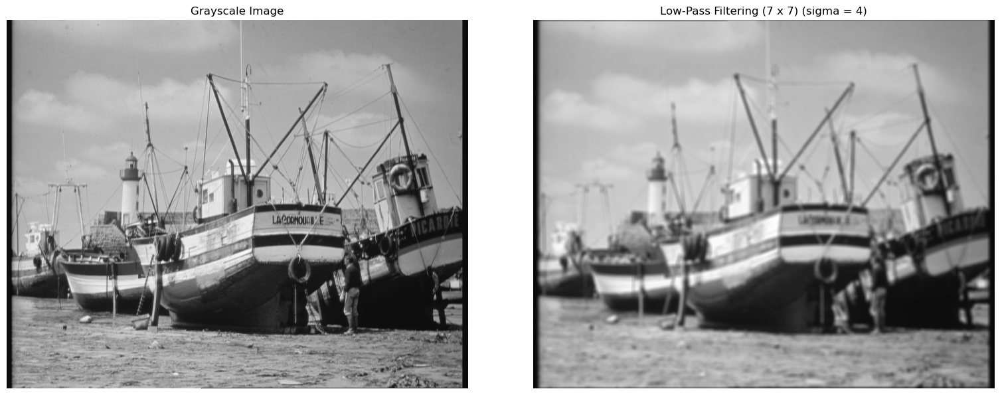

In [18]:
operations = [
    {'name': 'Low-Pass Filtering (7 x 7) (sigma = 0.5)', 'func': convolve2d, 'params': {'in2': K_7_sigma_0_5_gaussian, 'mode': 'same'}},
    {'name': 'Low-Pass Filtering (7 x 7) (sigma = 1)', 'func': convolve2d, 'params': {'in2': K_7_sigma_1_gaussian, 'mode': 'same'}},
    {'name': 'Low-Pass Filtering (7 x 7) (sigma = 2)', 'func': convolve2d, 'params': {'in2': K_7_sigma_2_gaussian, 'mode': 'same'}},
    {'name': 'Low-Pass Filtering (7 x 7) (sigma = 3)', 'func': convolve2d, 'params': {'in2': K_7_sigma_3_gaussian, 'mode': 'same'}},
    {'name': 'Low-Pass Filtering (7 x 7) (sigma = 4)', 'func': convolve2d, 'params': {'in2': K_7_sigma_4_gaussian, 'mode': 'same'}},
]

for op in operations:
    filtered_image = apply(image_3, op['func'], **op['params'])
    display_image_comparison(image_3, filtered_image, 'Grayscale Image', op['name'])

As sigma $\sigma$ inscreases, the spread of the generated Gaussian kernel increases, incorporating more information from surrounding pixels in the input image to pixels in the output image, essentially *mixing* the pixel values together more, which produces a stronger blurring effect. 

We can also use this example to show how low-pass filtering differs from median filtering.

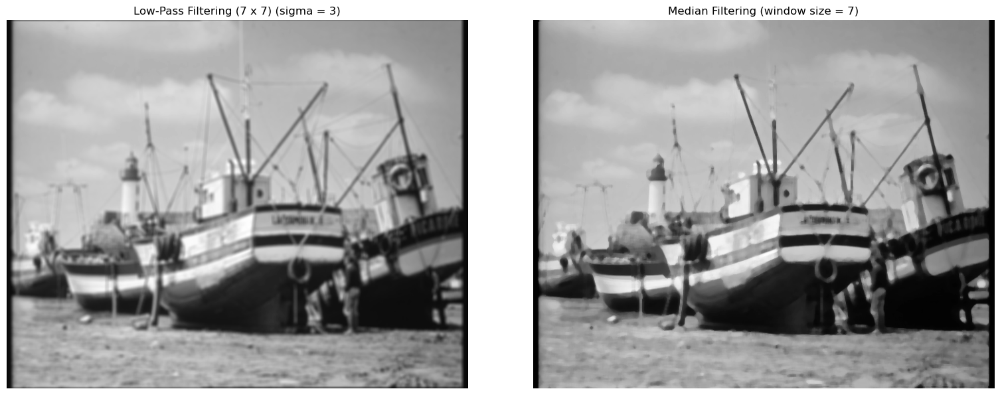

In [19]:
low_pass_filter_image_3 = apply(image_3, convolve2d, in2=K_7_sigma_3_gaussian, mode='same')
median_filter_image_3 = apply(image_3, median_filter, size=7)

display_image_comparison(low_pass_filter_image_3, median_filter_image_3, 'Low-Pass Filtering (7 x 7) (sigma = 3)', 'Median Filtering (window size = 7)')

We can see how the median filter performs a low-pass filtering of the image but maintains the edges in the image more than the standard low-pass filtering using Gaussian kernels.

#### Example 3

In [20]:
image_4_path = "../TEST-IMAGES/ADDITIONAL/pens.ppm"
image_4 = load_image(image_4_path)

Image Metadata for 'pens.ppm':
 - Format: PPM
 - Size on Disk: 720.01 KB
 - Dimensions: 512x480 pixels
 - Mode: RGB
 - Channels: 3


Since the image is in RGB, we'll first have to convert it to grayscale.

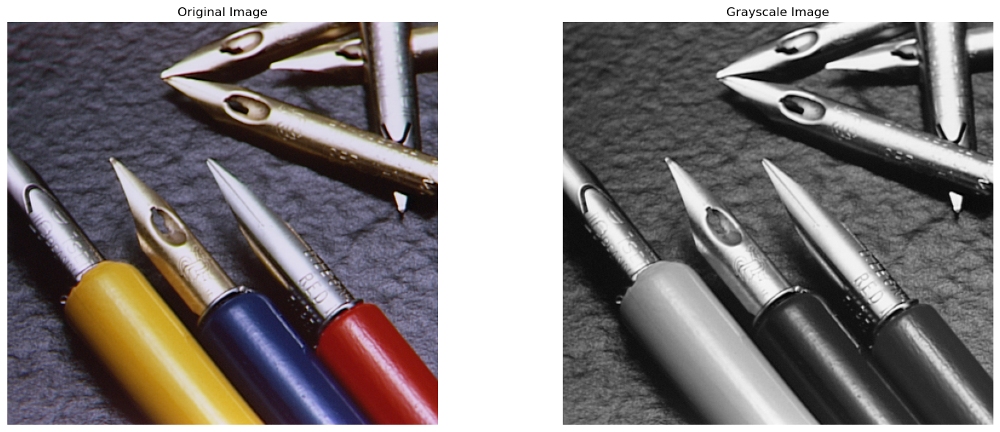

In [21]:
grayscale_image_4 = apply(image_4, rgb_to_grayscale)
display_image_comparison(image_4, grayscale_image_4, 'Original Image', 'Grayscale Image')

Lets use this example to show how filtering affects the frequency spectrum image.

First lets see what the frequency spectrum image of the unfiltered image looks like.

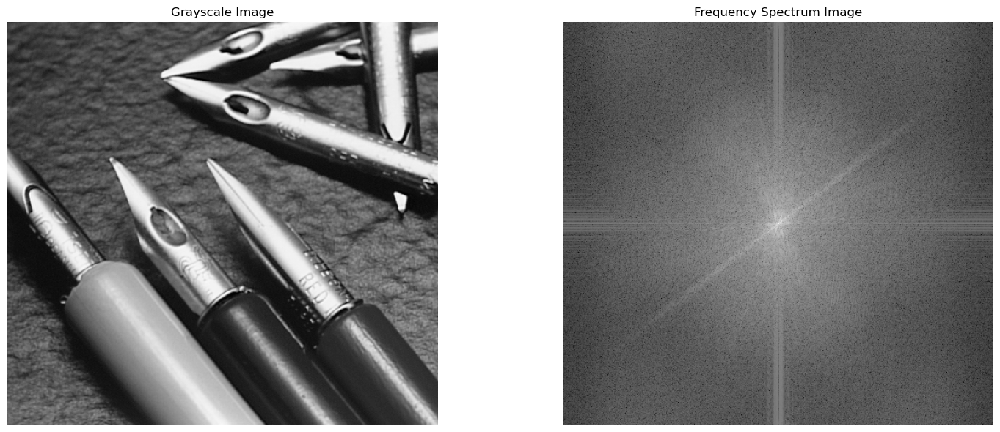

In [22]:
frequency_spectrum_image_4 = apply(grayscale_image_4, generate_frequency_spectrum)
display_image_comparison(grayscale_image_4, frequency_spectrum_image_4, 'Grayscale Image', 'Frequency Spectrum Image')

Let's see how a low-pass filter affects the frequecy spectrum image.

We'll use a more extreem low-pass filter so that we can observe the effects more clearly

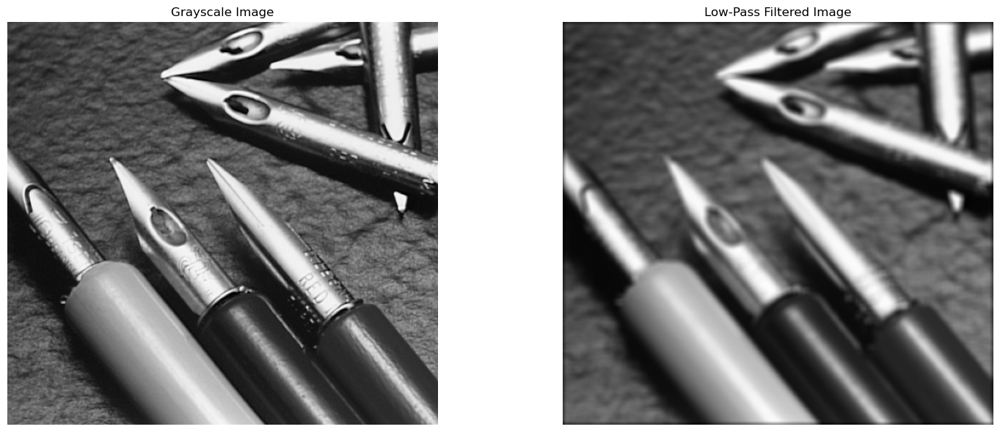

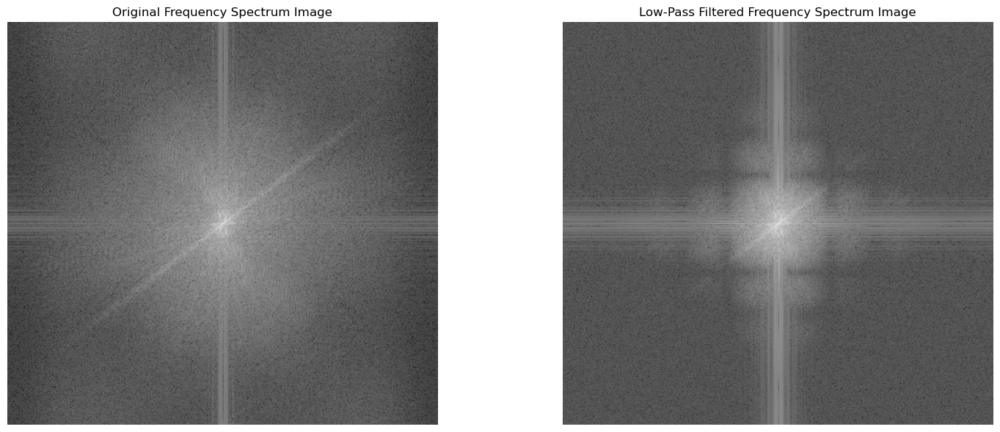

In [23]:
K_9_sigma_5_gaussian = generate_gaussian_kernel(9, 5)

low_pass_filtered_image_4 = apply(grayscale_image_4, convolve2d, in2=K_9_sigma_5_gaussian, mode='same')
low_pass_frequency_spectrum_image_4 = apply(low_pass_filtered_image_4, generate_frequency_spectrum)

display_image_comparison(grayscale_image_4, low_pass_filtered_image_4, 'Grayscale Image', 'Low-Pass Filtered Image')
display_image_comparison(frequency_spectrum_image_4, low_pass_frequency_spectrum_image_4, 'Original Frequency Spectrum Image', 'Low-Pass Filtered Frequency Spectrum Image')

We can see how in the low-pass filtered frequency spectrum image the outer regions of the frequency spectrum are attenuated (darker), meaning the high frequencies have been suppressed. This corresponds to the removal of fine details, edges, and noise in the spatial domain.

The grid-like cross structure present in the low-pass filtered frequency spectrum image, which is barely visible in the original frequency spectrum image, is also accentuated. This structure reflects the repeating pattern that exists in the original image (notice the 3 pens at the bottom left are stacked on top of each other).

Lets compare this to the effects of the high pass filter.

We'll use a $5 \times 5$ Laplacian kernel.

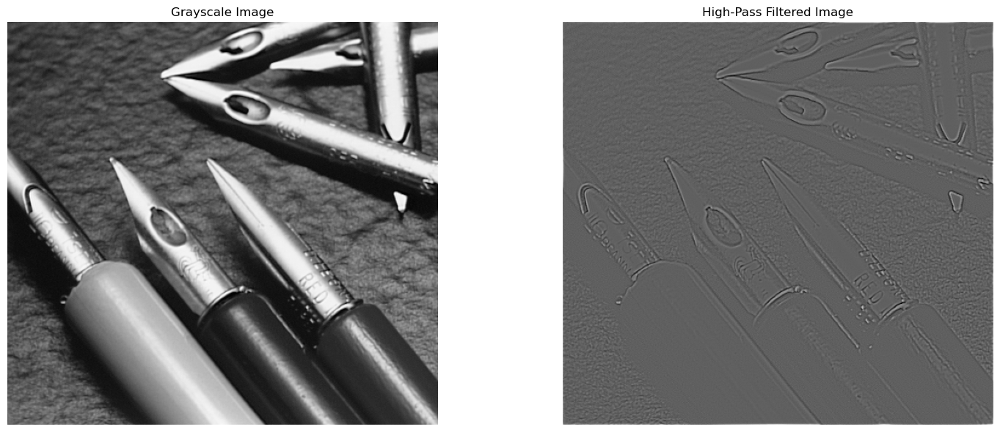

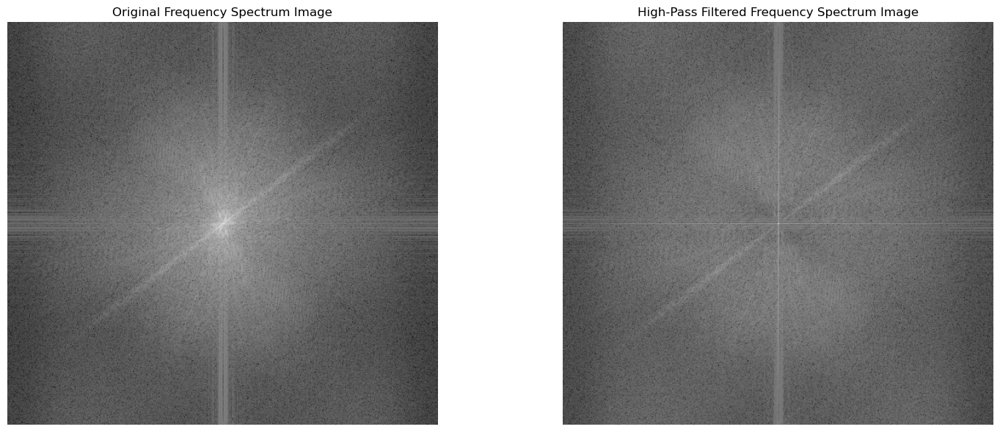

In [24]:
high_pass_filtered_image_4 = apply(grayscale_image_4, convolve2d, in2=K_5_laplacian, mode='same')
high_pass_frequency_spectrum_image_4 = apply(high_pass_filtered_image_4, generate_frequency_spectrum)

display_image_comparison(grayscale_image_4, high_pass_filtered_image_4, 'Grayscale Image', 'High-Pass Filtered Image')
display_image_comparison(frequency_spectrum_image_4, high_pass_frequency_spectrum_image_4, 'Original Frequency Spectrum Image', 'High-Pass Filtered Frequency Spectrum Image')

We can see how in the high-pass filtered frequency spectrum image the center region of the image, which was a bright region in the original frequency spectrum image, is now attenuated. This corresponds to a removal of the larger, smooth features are removed from the image, while sharper smaller features are more accentuated.